# Our Objective: Predicting Attrition of IBM Employees

In [1]:
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt 
import plotly.figure_factory as ff
import plotly.offline as py
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.figure_factory as ff
from plotly import tools

# Activate inline plotting in notebook
py.init_notebook_mode(connected = False)

In [2]:
#Set graph styles with Matplotlib
%matplotlib inline
sb.set_style("whitegrid")
plt.style.use("fivethirtyeight")

#Import dataset and print 1st 5 rows
df = pd.read_csv("EmployeeAttrition.csv")
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


**Check for missing values**

In [3]:
null_feat = pd.DataFrame(len(df['Attrition']) - df.isnull().sum(), columns = ['Count'])

trace = go.Bar(x = null_feat.index, y = null_feat['Count'] ,opacity = 0.8, marker=dict(color = 'lightgrey',
        line=dict(color='#000000',width=1.5)))

layout = dict(title =  "Missing Values")
                    
fig = dict(data = [trace], layout=layout)
py.iplot(fig)

No missing values > Continue with Exploratory Data Analysis

# 1. Exploratory Data Analysis

Check the vital statistics of the dataset using the type and shape attributes.

In [4]:
print("Data type : ", type(df))
print("Data dims : ", df.shape)

Data type :  <class 'pandas.core.frame.DataFrame'>
Data dims :  (1470, 35)


Check the variables (and their types) in the dataset using the dtypes attribute.

In [5]:
print(df.dtypes)

Age                          int64
Attrition                   object
BusinessTravel              object
DailyRate                    int64
Department                  object
DistanceFromHome             int64
Education                    int64
EducationField              object
EmployeeCount                int64
EmployeeNumber               int64
EnvironmentSatisfaction      int64
Gender                      object
HourlyRate                   int64
JobInvolvement               int64
JobLevel                     int64
JobRole                     object
JobSatisfaction              int64
MaritalStatus               object
MonthlyIncome                int64
MonthlyRate                  int64
NumCompaniesWorked           int64
Over18                      object
OverTime                    object
PercentSalaryHike            int64
PerformanceRating            int64
RelationshipSatisfaction     int64
StandardHours                int64
StockOptionLevel             int64
TotalWorkingYears   

Summary of dataframe

In [6]:
#Information about the variables
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

Statistical Summary of Numerical Data

In [7]:
df.describe()

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,...,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,1.0,1024.865306,2.721769,65.891156,2.729932,2.063946,...,2.712245,80.0,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,0.0,602.024335,1.093082,20.329428,0.711561,1.106940,...,1.081209,0.0,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.0,1.000000,1.000000,30.000000,1.000000,1.000000,...,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,1.0,491.250000,2.000000,48.000000,2.000000,1.000000,...,2.000000,80.0,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,1.0,1020.500000,3.000000,66.000000,3.000000,2.000000,...,3.000000,80.0,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,1.0,1555.750000,4.000000,83.750000,3.000000,3.000000,...,4.000000,80.0,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,1.0,2068.000000,4.000000,100.000000,4.000000,5.000000,...,4.000000,80.0,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


**Target (Attrition) Distribution**

In [8]:
#Attrition in the Dataset
print("Type of Attrition Value:", len(df["Attrition"].unique()))

#Attrition Count in the dataset
print(df["Attrition"].value_counts())

# Get Histogram from plotly.graph_objs (go)
trace = go.Histogram(x = df['Attrition'], histnorm = 'density')
layout = go.Layout(title = 'Attrition Distribution')
data = [trace]
fig = go.Figure(data = data, layout = layout)
py.iplot(fig)

Type of Attrition Value: 2
No     1233
Yes     237
Name: Attrition, dtype: int64


In [9]:
trace = go.Pie(labels = ['No Attrition', 'Yes Attrition'], values = df['Attrition'].value_counts(), 
               textfont=dict(size=15), opacity = 0.8,
               marker=dict(colors=['lightskyblue','gold'], 
                           line=dict(color='#000000', width=1.5)))


layout = dict(title = 'Percentage of Attrition Distribution')
           
fig = dict(data = [trace], layout=layout)
py.iplot(fig)

Drop irrelevant columns

In [10]:
# Reassign target
df.Attrition.replace(to_replace = dict(Yes = 1, No = 0), inplace = True)
# Drop useless feat
df = df.drop(columns=['StandardHours', 'EmployeeCount', 'Over18'])

Check column elements in the dataset and see if they are unique

In [11]:
categorical_col = []
for column in df.columns:
    if df[column].dtype == object and len(df[column].unique()) <= 50:
        categorical_col.append(column)

Convert Attrition column to Category Data Type

In [12]:
df['Attrition'] = df.Attrition.astype("category").cat.codes

# 2. Visualisation of Data

**Check distributions of features and plot barplot (hue = Attrition)**

In [36]:
def plot_distribution(var_select, bin_size) : 
# Calculate the correlation coefficient between the new variable and the target
    corr = df['Attrition'].corr(df[var_select])
    corr = np.round(corr,3)
    tmp1 = attrition[var_select]
    tmp2 = no_attrition[var_select]
    hist_data = [tmp1, tmp2]
    
    group_labels = ['Yes Attrition', 'No Attrition']
    colors = ['#FFD700', '#7EC0EE']

    fig = ff.create_distplot(hist_data, group_labels, colors = colors, show_hist = True, curve_type='kde', bin_size = bin_size)
    
    fig['layout'].update(title = var_select+' '+'(corr target ='+ str(corr)+')')

    py.iplot(fig, filename = 'Density plot')

In [34]:
def barplot(var_select, x_no_numeric) :
    tmp1 = df[(df['Attrition'] != 0)]
    tmp2 = df[(df['Attrition'] == 0)]
    tmp3 = pd.DataFrame(pd.crosstab(df[var_select],df['Attrition']), )
    tmp3['Attr%'] = tmp3[1] / (tmp3[1] + tmp3[0]) * 100
    if x_no_numeric == True  : 
        tmp3 = tmp3.sort_values(1, ascending = False)

    color=['lightskyblue','gold' ]
    trace1 = go.Bar(
        x=tmp1[var_select].value_counts().keys().tolist(),
        y=tmp1[var_select].value_counts().values.tolist(),
        name='Yes_Attrition',opacity = 0.8, marker=dict(
        color='gold',
        line=dict(color='#000000',width=1)))

    
    trace2 = go.Bar(
        x=tmp2[var_select].value_counts().keys().tolist(),
        y=tmp2[var_select].value_counts().values.tolist(),
        name='No_Attrition', opacity = 0.8, marker=dict(
        color='lightskyblue',
        line=dict(color='#000000',width=1)))
    
    trace3 =  go.Scatter(   
        x=tmp3.index,
        y=tmp3['Attr%'],
        yaxis = 'y2',
        name='% Attrition', opacity = 0.6, marker=dict(
        color='black',
        line=dict(color='#000000',width=0.5
        )))

    layout = dict(title =  str(var_select),
              xaxis=dict(), 
              yaxis=dict(title= 'Count'), 
              yaxis2=dict(range= [-0, 75], 
                          overlaying= 'y', 
                          anchor= 'x', 
                          side= 'right',
                          zeroline=False,
                          showgrid= False, 
                          title= '% Attrition'
                         ))

    fig = go.Figure(data=[trace1, trace2, trace3], layout=layout)
    py.iplot(fig)

In [35]:
plot_distribution('Age', False)
barplot('Age', False)
plot_distribution('DailyRate', 100)
plot_distribution('DistanceFromHome', False)
barplot('DistanceFromHome', False)
plot_distribution('HourlyRate', False)
plot_distribution('MonthlyIncome', 100)
plot_distribution('MonthlyRate', 100)
plot_distribution('NumCompaniesWorked', False)
barplot('NumCompaniesWorked',False)
plot_distribution('PercentSalaryHike', False)
barplot('PercentSalaryHike', False) 
plot_distribution('TotalWorkingYears', False)
barplot('TotalWorkingYears', False)
plot_distribution('TrainingTimesLastYear', False)
barplot('TrainingTimesLastYear',False)
plot_distribution('YearsAtCompany', False)
barplot('YearsAtCompany', False)
plot_distribution('YearsInCurrentRole', False)
barplot('YearsInCurrentRole', False)
plot_distribution('YearsSinceLastPromotion', False)
barplot('YearsSinceLastPromotion', False)
plot_distribution('YearsWithCurrManager', False)
barplot('YearsWithCurrManager', False)

**Plot Pie Charts and Bar Charts of relevant variables distribution in Employees Attrition**

In [13]:
attrition = df[(df['Attrition'] != 0)]
no_attrition = df[(df['Attrition'] == 0)]

def plot_pie(var_select) :
    
    colors = ['gold', 'lightgreen', 'lightcoral', 'lightskyblue', 'lightgrey', 'orange', 'white', 'lightpink']
    trace1 = go.Pie(values  = attrition[var_select].value_counts().values.tolist(),
                    labels  = attrition[var_select].value_counts().keys().tolist(),
                    textfont=dict(size=15), opacity = 0.8,
                    hoverinfo = "label+percent+name",
                    domain  = dict(x = [0,.48]),
                    name    = "Attrition Employes",
                    marker  = dict(colors = colors, line = dict(width = 1.5)))
    trace2 = go.Pie(values  = no_attrition[var_select].value_counts().values.tolist(),
                    labels  = no_attrition[var_select].value_counts().keys().tolist(),
                    textfont=dict(size=15), opacity = 0.8,
                    hoverinfo = "label+percent+name",
                    marker  = dict(colors = colors, line = dict(width = 1.5)),
                    domain  = dict(x = [.52,1]),
                    name    = "Non Attrition Employes" )

    layout = go.Layout(dict(title = var_select + " distribution in Employes Attrition ",
                            annotations = [dict(text = "Yes Attrition",
                                                font = dict(size = 13),
                                                showarrow = False,
                                                x = .22, y = -0.1),
                                            dict(text = "No Attrition",
                                                font = dict(size = 13),
                                                showarrow = False,
                                                x = .8,y = -.1)]))
                                          

    fig  = go.Figure(data = [trace1,trace2],layout = layout)
    py.iplot(fig)

In [14]:
def barplot(var_select, x_no_numeric) :
    tmp1 = df[(df['Attrition'] != 0)]
    tmp2 = df[(df['Attrition'] == 0)]
    tmp3 = pd.DataFrame(pd.crosstab(df[var_select],df['Attrition']), )
    tmp3['Attr%'] = tmp3[1] / (tmp3[1] + tmp3[0]) * 100
    if x_no_numeric == True  : 
        tmp3 = tmp3.sort_values(1, ascending = False)

    color=['lightskyblue','gold' ]
    trace1 = go.Bar(
        x=tmp1[var_select].value_counts().keys().tolist(),
        y=tmp1[var_select].value_counts().values.tolist(),
        name='Yes Attrition',opacity = 0.8, marker=dict(
        color='gold',
        line=dict(color='#000000',width=1)))

    
    trace2 = go.Bar(
        x=tmp2[var_select].value_counts().keys().tolist(),
        y=tmp2[var_select].value_counts().values.tolist(),
        name='No Attrition', opacity = 0.8, marker=dict(
        color='lightskyblue',
        line=dict(color='#000000',width=1)))
    
    trace3 =  go.Scatter(   
        x=tmp3.index,
        y=tmp3['Attr%'],
        yaxis = 'y2',
        name='% Attrition', opacity = 0.6, marker=dict(
        color='black',
        line=dict(color='#000000',width=0.5
        )))

    layout = dict(title =  str(var_select),
              xaxis=dict(), 
              yaxis=dict(title= 'Count'), 
              yaxis2=dict(range= [-0, 75], 
                          overlaying= 'y', 
                          anchor= 'x', 
                          side= 'right',
                          zeroline=False,
                          showgrid= False, 
                          title= '% Attrition'
                         ))

    fig = go.Figure(data=[trace1, trace2, trace3], layout=layout)
    py.iplot(fig)

In [15]:
plot_pie("Gender")
barplot('Gender',True)
plot_pie('OverTime')
barplot('OverTime',True)
plot_pie('BusinessTravel')
barplot('BusinessTravel',True)
plot_pie('JobRole')
barplot('JobRole',True)
plot_pie('Department') 
barplot('Department',True)
plot_pie('MaritalStatus') 
barplot('MaritalStatus',True)
plot_pie('EducationField') 
barplot('EducationField',True)
plot_pie('Education') 
barplot('Education',False)
plot_pie('EnvironmentSatisfaction')
barplot('EnvironmentSatisfaction',False)
plot_pie('JobInvolvement')
barplot('JobInvolvement', False)
plot_pie('JobLevel')
barplot('JobLevel',False)
plot_pie('JobSatisfaction')
barplot('JobSatisfaction',False)
plot_pie('PerformanceRating')
barplot('PerformanceRating',False)
plot_pie('RelationshipSatisfaction')
barplot('RelationshipSatisfaction', False)
plot_pie('StockOptionLevel')
barplot('StockOptionLevel', False)
plot_pie('WorkLifeBalance')
barplot('WorkLifeBalance', False)

Numerical Data

In [16]:
numerical = pd.DataFrame(df[["Age", "DailyRate", "DistanceFromHome", "Education", "EnvironmentSatisfaction", "HourlyRate", "JobInvolvement", "JobLevel", "JobSatisfaction", "MonthlyIncome", "MonthlyRate", "NumCompaniesWorked", "PercentSalaryHike", "PerformanceRating", "RelationshipSatisfaction", "StockOptionLevel", "TotalWorkingYears", "TrainingTimesLastYear", "WorkLifeBalance", "YearsAtCompany", "YearsInCurrentRole", "YearsSinceLastPromotion", "YearsWithCurrManager"]])

#Summary Statistics for all Variables
numerical.describe().round(2)

,Age,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,...,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00
mean,36.92,802.49,9.19,2.91,2.72,65.89,2.73,2.06,2.73,6502.93,...,3.15,2.71,0.79,11.28,2.80,2.76,7.01,4.23,2.19,4.12
std,9.14,403.51,8.11,1.02,1.09,20.33,0.71,1.11,1.10,4707.96,...,0.36,1.08,0.85,7.78,1.29,0.71,6.13,3.62,3.22,3.57
min,18.00,102.00,1.00,1.00,1.00,30.00,1.00,1.00,1.00,1009.00,...,3.00,1.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00
25%,30.00,465.00,2.00,2.00,2.00,48.00,2.00,1.00,2.00,2911.00,...,3.00,2.00,0.00,6.00,2.00,2.00,3.00,2.00,0.00,2.00
50%,36.00,802.00,7.00,3.00,3.00,66.00,3.00,2.00,3.00,4919.00,...,3.00,3.00,1.00,10.00,3.00,3.00,5.00,3.00,1.00,3.00
75%,43.00,1157.00,14.00,4.00,4.00,83.75,3.00,3.00,4.00,8379.00,...,3.00,4.00,1.00,15.00,3.00,3.00,9.00,7.00,3.00,7.00
max,60.00,1499.00,29.00,5.00,4.00,100.00,4.00,5.00,4.00,19999.00,...,4.00,4.00,3.00,40.00,6.00,4.00,40.00,18.00,15.00,17.00


Summary of Numerical Data

In [17]:
numerical.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype
---  ------                    --------------  -----
 0   Age                       1470 non-null   int64
 1   DailyRate                 1470 non-null   int64
 2   DistanceFromHome          1470 non-null   int64
 3   Education                 1470 non-null   int64
 4   EnvironmentSatisfaction   1470 non-null   int64
 5   HourlyRate                1470 non-null   int64
 6   JobInvolvement            1470 non-null   int64
 7   JobLevel                  1470 non-null   int64
 8   JobSatisfaction           1470 non-null   int64
 9   MonthlyIncome             1470 non-null   int64
 10  MonthlyRate               1470 non-null   int64
 11  NumCompaniesWorked        1470 non-null   int64
 12  PercentSalaryHike         1470 non-null   int64
 13  PerformanceRating         1470 non-null   int64
 14  RelationshipSatisfaction  1470 non-null 

**Plot histogram of all numerical variables**

In [18]:
from plotly.subplots import make_subplots

fig = make_subplots(rows=12, cols=2)

trace0 = go.Histogram(x=numerical['Age'], name='Age')
trace1 = go.Histogram(x=numerical['DailyRate'], name='DailyRate')
trace2 = go.Histogram(x=numerical['DistanceFromHome'], name='DistanceFromHome')
trace3 = go.Histogram(x=numerical['Education'], name='Education')
trace4 = go.Histogram(x=numerical['EnvironmentSatisfaction'], name='EnvironmentSatisfaction')
trace5 = go.Histogram(x=numerical['HourlyRate'], name='HourlyRate')
trace6 = go.Histogram(x=numerical['JobInvolvement'], name='JobInvolvement')
trace7 = go.Histogram(x=numerical['JobLevel'], name='JobLevel')
trace8 = go.Histogram(x=numerical['JobSatisfaction'], name='JobSatisfaction')
trace9 = go.Histogram(x=numerical['MonthlyIncome'], name='MonthlyIncome')
trace10 = go.Histogram(x=numerical['MonthlyRate'], name='MonthlyRate')
trace11 = go.Histogram(x=numerical['NumCompaniesWorked'], name='NumCompaniesWorked')
trace12 = go.Histogram(x=numerical['PercentSalaryHike'], name='PercentSalaryHike')
trace13 = go.Histogram(x=numerical['PerformanceRating'], name='PerformanceRating')
trace14 = go.Histogram(x=numerical['RelationshipSatisfaction'], name='RelationshipSatisfaction')
trace15 = go.Histogram(x=numerical['StockOptionLevel'], name='StockOptionLevel')
trace16 = go.Histogram(x=numerical['TotalWorkingYears'], name='TotalWorkingYears')
trace17 = go.Histogram(x=numerical['TrainingTimesLastYear'], name='TrainingTimesLastYear')
trace18 = go.Histogram(x=numerical['WorkLifeBalance'], name='WorkLifeBalance')
trace19 = go.Histogram(x=numerical['YearsAtCompany'], name='YearsAtCompany')
trace20 = go.Histogram(x=numerical['YearsInCurrentRole'], name='YearsInCurrentRole')
trace21 = go.Histogram(x=numerical['YearsSinceLastPromotion'], name='YearsSinceLastPromotion')
trace22 = go.Histogram(x=numerical['YearsWithCurrManager'], name='YearsWithCurrManager')

fig.update_layout(
    autosize=False,
    width=800,
    height=2000,
    title_text='Histogram of Numerical Distribution',
    bargap=0.2, # gap between bars of adjacent location coordinates
    bargroupgap=0.1 # gap between bars of the same location coordinates) # title of plot
)  
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 1, 2)
fig.append_trace(trace2, 2, 1)
fig.append_trace(trace3, 2, 2)
fig.append_trace(trace4, 3, 1)
fig.append_trace(trace5, 3, 2)
fig.append_trace(trace6, 4, 1)
fig.append_trace(trace7, 4, 2)
fig.append_trace(trace8, 5, 1)
fig.append_trace(trace9, 5, 2)
fig.append_trace(trace10, 6, 1)
fig.append_trace(trace11, 6, 2)
fig.append_trace(trace12, 7, 1)
fig.append_trace(trace13, 7, 2)
fig.append_trace(trace14, 8, 1)
fig.append_trace(trace15, 8, 2)
fig.append_trace(trace16, 9, 1)
fig.append_trace(trace17, 9, 2)
fig.append_trace(trace18, 10, 1)
fig.append_trace(trace19, 10, 2)
fig.append_trace(trace20, 11, 1)
fig.append_trace(trace21, 11, 2)
fig.append_trace(trace22, 12, 1)

fig.show()

**Plot boxplot of all numerical variables**

In [19]:
fig = go.Figure()

# Use x instead of y argument for horizontal plot
fig = make_subplots(rows=12, cols=2)

trace0 = go.Box(x=df['Attrition'], y=numerical['Age'], name='Age')
trace1 = go.Box(x=df['Attrition'], y=numerical['DailyRate'], name='DailyRate')
trace2 = go.Box(x=df['Attrition'], y=numerical['DistanceFromHome'], name='DistanceFromHome')
trace3 = go.Box(x=df['Attrition'], y=numerical['Education'], name='Education')
trace4 = go.Box(x=df['Attrition'], y=numerical['EnvironmentSatisfaction'], name='EnvironmentSatisfaction')
trace5 = go.Box(x=df['Attrition'], y=numerical['HourlyRate'], name='HourlyRate')
trace6 = go.Box(x=df['Attrition'], y=numerical['JobInvolvement'], name='JobInvolvement')
trace7 = go.Box(x=df['Attrition'], y=numerical['JobLevel'], name='JobLevel')
trace8 = go.Box(x=df['Attrition'], y=numerical['JobSatisfaction'], name='JobSatisfaction')
trace9 = go.Box(x=df['Attrition'], y=numerical['MonthlyIncome'], name='MonthlyIncome')
trace10 = go.Box(x=df['Attrition'], y=numerical['MonthlyRate'], name='MonthlyRate')
trace11 = go.Box(x=df['Attrition'], y=numerical['NumCompaniesWorked'], name='NumCompaniesWorked')
trace12 = go.Box(x=df['Attrition'], y=numerical['PercentSalaryHike'], name='PercentSalaryHike')
trace13 = go.Box(x=df['Attrition'], y=numerical['PerformanceRating'], name='PerformanceRating')
trace14 = go.Box(x=df['Attrition'], y=numerical['RelationshipSatisfaction'], name='RelationshipSatisfaction')
trace15 = go.Box(x=df['Attrition'], y=numerical['StockOptionLevel'], name='StockOptionLevel')
trace16 = go.Box(x=df['Attrition'], y=numerical['TotalWorkingYears'], name='TotalWorkingYears')
trace17 = go.Box(x=df['Attrition'], y=numerical['TrainingTimesLastYear'], name='TrainingTimesLastYear')
trace18 = go.Box(x=df['Attrition'], y=numerical['WorkLifeBalance'], name='WorkLifeBalance')
trace19 = go.Box(x=df['Attrition'], y=numerical['YearsAtCompany'], name='YearsAtCompany')
trace20 = go.Box(x=df['Attrition'], y=numerical['YearsInCurrentRole'], name='YearsInCurrentRole')
trace21 = go.Box(x=df['Attrition'], y=numerical['YearsSinceLastPromotion'], name='YearsSinceLastPromotion')
trace22 = go.Box(x=df['Attrition'], y=numerical['YearsWithCurrManager'], name='YearsWithCurrManager')

fig.update_layout(
    autosize=False,
    width=800,
    height=2000,
    title_text='Boxplot of Attrition vs All Numerical Variables')  

fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 1, 2)
fig.append_trace(trace2, 2, 1)
fig.append_trace(trace3, 2, 2)
fig.append_trace(trace4, 3, 1)
fig.append_trace(trace5, 3, 2)
fig.append_trace(trace6, 4, 1)
fig.append_trace(trace7, 4, 2)
fig.append_trace(trace8, 5, 1)
fig.append_trace(trace9, 5, 2)
fig.append_trace(trace10, 6, 1)
fig.append_trace(trace11, 6, 2)
fig.append_trace(trace12, 7, 1)
fig.append_trace(trace13, 7, 2)
fig.append_trace(trace14, 8, 1)
fig.append_trace(trace15, 8, 2)
fig.append_trace(trace16, 9, 1)
fig.append_trace(trace17, 9, 2)
fig.append_trace(trace18, 10, 1)
fig.append_trace(trace19, 10, 2)
fig.append_trace(trace20, 11, 1)
fig.append_trace(trace21, 11, 2)
fig.append_trace(trace22, 12, 1)

fig.show()

**Plotting how every feature correlate with "Target - Attrition"**

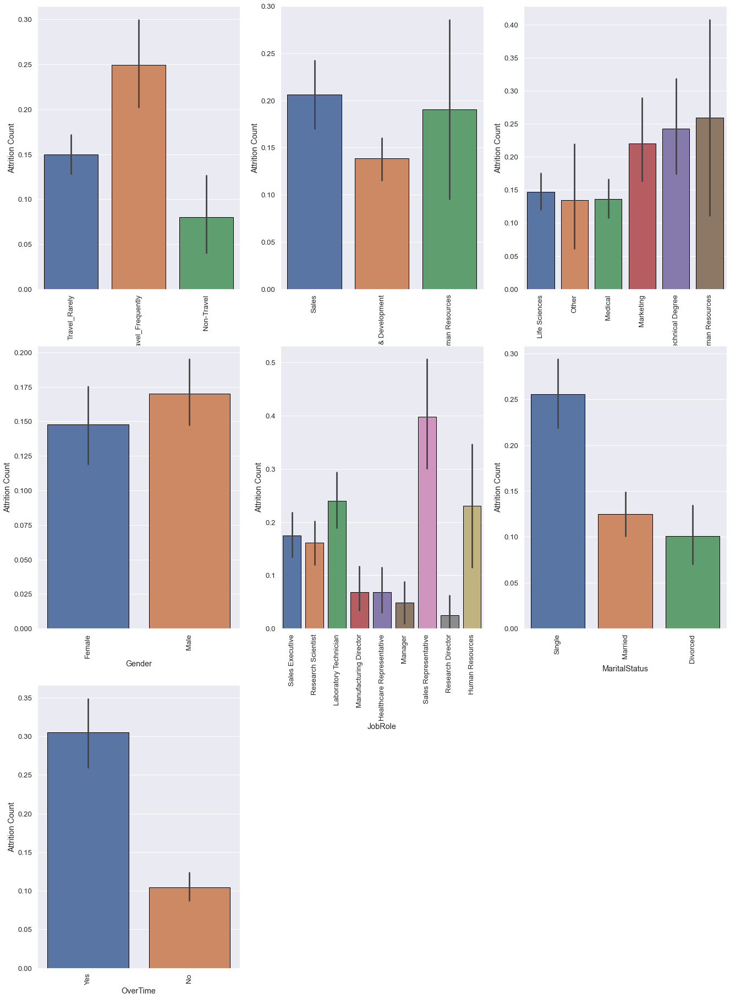

In [20]:
sb.set(font_scale=1.2)
plt.figure(figsize=(20,30))

for i, column in enumerate(categorical_col, 1):
    plt.subplot(3, 3, i)
    g = sb.barplot(edgecolor='black', x=f"{column}", y='Attrition', data=df)
    g.set_xticklabels(g.get_xticklabels(), rotation=90)
    plt.ylabel('Attrition Count')
    plt.xlabel(f'{column}')

## Conclusions:

**BusinessTravel:**  Workers who travel alot are more likely to quit than other employees.

**Department:**  Workers in Research & Development are more likely to stay than the workers on other departement.

**EducationField :**  Workers with Human Resources and Technical Degree are more likely to quit than employees from other fields of educations.

**Gender :**  Male employees are more likely to quit.

**JobRole :** Workers in Laboratory Technician, Sales Representative, and Human Resources are more likely to quit than workers in other positions.

**MaritalStatus :** Workers who have Single marital status are more likely to quit than Married, and Divorced.

**OverTime :** Workers who work more hours are likely to quit than others.

# 3. Correlation Matrix

Plot correlation matrix - Heatmap

In [21]:
#Correlation Matrix


# Heatmap of the Correlation Matrix

trace=go.Heatmap(
                   z = df.corr(), 
                   x = df.columns, 
                   y = df.columns, 
        reversescale = True,
          colorscale = [[0.0, "rgb(165,0,38)"],
                        [0.1111111111111111, "rgb(215,48,39)"],
                        [0.2222222222222222, "rgb(244,109,67)"],
                        [0.3333333333333333, "rgb(253,174,97)"],
                        [0.4444444444444444, "rgb(254,224,144)"],
                        [0.5555555555555556, "rgb(224,243,248)"],
                        [0.6666666666666666, "rgb(171,217,233)"],
                        [0.7777777777777778, "rgb(116,173,209)"],
                        [0.8888888888888888, "rgb(69,117,180)"],
                        [1.0, "rgb(49,54,149)"]])     

data=[trace]
py.iplot(data, filename='labelled-heatmap')

# 4. Data Preparation (train & test)

In [22]:
#data cleaning
#categorical_col.remove('Attrition')

Transform all categorical data to dummy 

In [23]:
from sklearn.preprocessing import LabelEncoder

label = LabelEncoder()
for column in categorical_col:
    df[column] = label.fit_transform(df[column])

Split dataset to train and test

In [24]:
from sklearn.model_selection import train_test_split

X = df.drop('Attrition', axis=1)
y = df.Attrition

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

Check the sample sizes

In [25]:
print("Train Set :", y_train.shape, X_train.shape)
print("Test Set  :", y_test.shape, X_test.shape)

Train Set : (1029,) (1029, 31)
Test Set  : (441,) (441, 31)


**Summary Statistics for Predictors**

In [26]:
X_train.describe()

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1029.000000,1029.000000,1029.000000,1029.000000,1029.000000,1029.000000,1029.000000,1029.000000,1029.000000,1029.000000,...,1029.000000,1029.000000,1029.000000,1029.000000,1029.000000,1029.000000,1029.000000,1029.000000,1029.000000,1029.000000
mean,36.910593,1.608358,802.620019,1.261419,9.364431,2.892128,2.239067,1024.367347,2.683188,0.599611,...,3.159378,2.689990,0.822157,11.196307,2.782313,2.748299,6.942663,4.215743,2.119534,4.005831
std,9.263531,0.661010,407.368993,0.524384,8.222723,1.053541,1.310386,606.301635,1.096829,0.490215,...,0.366206,1.077767,0.874662,7.857581,1.283401,0.697278,6.068322,3.658595,3.108651,3.522574
min,18.000000,0.000000,102.000000,0.000000,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,...,3.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,1.000000,464.000000,1.000000,2.000000,2.000000,1.000000,496.000000,2.000000,0.000000,...,3.000000,2.000000,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,35.000000,2.000000,804.000000,1.000000,7.000000,3.000000,2.000000,1019.000000,3.000000,1.000000,...,3.000000,3.000000,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,2.000000,1167.000000,2.000000,14.000000,4.000000,3.000000,1553.000000,4.000000,1.000000,...,3.000000,4.000000,1.000000,15.000000,3.000000,3.000000,10.000000,7.000000,2.000000,7.000000
max,60.000000,2.000000,1496.000000,2.000000,29.000000,5.000000,5.000000,2068.000000,4.000000,1.000000,...,4.000000,4.000000,3.000000,40.000000,6.000000,4.000000,37.000000,18.000000,15.000000,17.000000


**Draw the distributions of first 6 Predictors**

C:\Users\Marcus\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning:

Default bandwidth for data is 0; skipping density estimation.



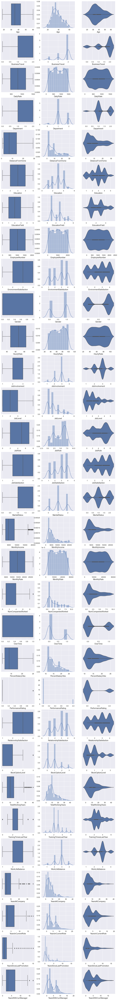

In [27]:
f, axes = plt.subplots(31, 3, figsize=(14, 130))

count = 0
for var in X_train:
    sb.boxplot(X_train[var], orient = "h", ax = axes[count,0])
    sb.distplot(X_train[var], ax = axes[count,1])
    sb.violinplot(X_train[var], ax = axes[count,2])
    count += 1

# 5. Create the Decision Tree Classifier

Machine Learning Algorithms to calculate and predict Train & Test data - Accuracy score, Classification Report, Confusion Matrix data, etc.

In [28]:
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score

def print_score(clf, X_train, y_train, X_test, y_test, train=True):
    if train:
        pred = clf.predict(X_train)
        print("Train Result:\n===========================================")
        print(f"accuracy score: {accuracy_score(y_train, pred):.4f}\n")
        print(f"Classification Report: \n \tPrecision: {precision_score(y_train, pred)}\n\tRecall Score: {recall_score(y_train, pred)}\n\tF1 score: {f1_score(y_train, pred)}\n")
        print(f"Confusion Matrix: \n {confusion_matrix(y_train, clf.predict(X_train))}\n")
        
    elif train==False:
        pred = clf.predict(X_test)
        print("Test Result:\n===========================================")        
        print(f"accuracy score: {accuracy_score(y_test, pred)}\n")
        print(f"Classification Report: \n \tPrecision: {precision_score(y_test, pred)}\n\tRecall Score: {recall_score(y_test, pred)}\n\tF1 score: {f1_score(y_test, pred)}\n")
        print(f"Confusion Matrix: \n {confusion_matrix(y_test, pred)}\n")

**Create Decision Tree using Train Data**

Decision Tree Classifier using **random_state(any number)** to reproduce the same problem each time it runs (Prevent different set of train/test data points when splitting - Help in debugging)

In [29]:
from sklearn.tree import DecisionTreeClassifier

# Decision Tree using Train Data
# Create the decision tree object

dectree = DecisionTreeClassifier(random_state=42)
dectree.fit(X_train, y_train)                    # train the decision tree model

# Plot the Decision Tree
from sklearn.tree import export_graphviz
treedot = export_graphviz(dectree,                                      # the model
                          feature_names = X_train.columns,              # the features 
                          out_file = None,                              # output file
                          filled = True,                                # node colors
                          rounded = True,                               # make pretty
                          special_characters = True)                    # postscript

print_score(dectree, X_train, y_train, X_test, y_test, train=True)
print_score(dectree, X_train, y_train, X_test, y_test, train=False)

Train Result:
accuracy score: 1.0000

Classification Report: 
 	Precision: 1.0
	Recall Score: 1.0
	F1 score: 1.0

Confusion Matrix: 
 [[853   0]
 [  0 176]]

Test Result:
accuracy score: 0.7777777777777778

Classification Report: 
 	Precision: 0.26582278481012656
	Recall Score: 0.3442622950819672
	F1 score: 0.29999999999999993

Confusion Matrix: 
 [[322  58]
 [ 40  21]]



**Plot Visualization of Decision Tree Classification**

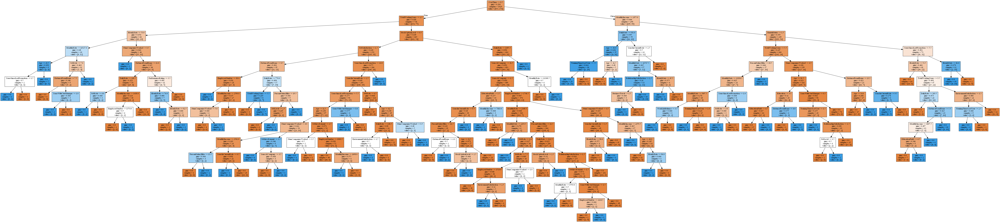

In [30]:
from IPython.display import Image
from six import StringIO
from sklearn.tree import export_graphviz
import pydot

features = list(df.columns)
features.remove("Attrition")

dot_data = StringIO()
export_graphviz(dectree, out_file=dot_data, feature_names=features, filled=True)
graph = pydot.graph_from_dot_data(dot_data.getvalue())
Image(graph[0].create_png())

**Plot Confusion Matrix of Train and Test Data**

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 1.0

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.7777777777777778



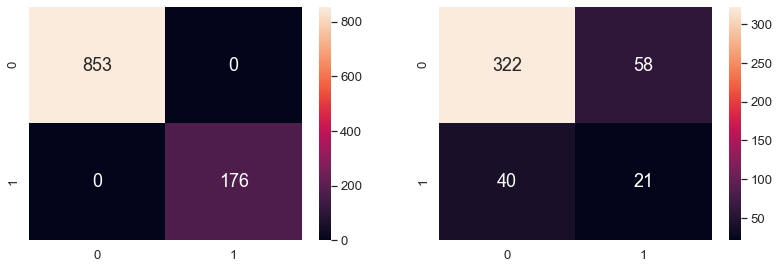

In [31]:
from sklearn.metrics import confusion_matrix

# Predict Attrition values 
y_train_pred = dectree.predict(X_train)
y_test_pred = dectree.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", dectree.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", dectree.score(X_test, y_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

# Attempt of Random Forest Classification
- A random forest is a meta estimator that fits a number of decision tree classifiers on various sub-samples of the dataset and uses averaging to improve the predictive accuracy and control over-fitting.

In [32]:
#Random forest classifier
from sklearn.ensemble import RandomForestClassifier

#Estimate number of trees in the forest = 100
rf_clf = RandomForestClassifier(n_estimators=100)
rf_clf.fit(X_train, y_train)

print_score(rf_clf, X_train, y_train, X_test, y_test, train=True)
print_score(rf_clf, X_train, y_train, X_test, y_test, train=False)

Train Result:
accuracy score: 1.0000

Classification Report: 
 	Precision: 1.0
	Recall Score: 1.0
	F1 score: 1.0

Confusion Matrix: 
 [[853   0]
 [  0 176]]

Test Result:
accuracy score: 0.8662131519274376

Classification Report: 
 	Precision: 0.625
	Recall Score: 0.08196721311475409
	F1 score: 0.14492753623188404

Confusion Matrix: 
 [[377   3]
 [ 56   5]]

